## Network Architecture

In [1]:
# Imports for Model Creation
import torch
from torch.nn import functional as F
from torch.nn import (
	Module, Conv2d, ReLU, PReLU, Dropout2d, AvgPool2d,
	Upsample, MaxPool2d, Sequential, MaxUnpool2d,
	BatchNorm2d, AdaptiveAvgPool2d, ConvTranspose2d
)

### Activation Module

Inspired by **Swish** Activation Function (Paper), **Mish** is a Self Regularized Non-Monotonic Neural Activation Function. Mish Activation Function can be mathematically represented by the following formula:

$f(x) = x * tanh(ln(1 + e^{x}))$

It can also be represented using the **Softplus** Activation Function:
$f(x) = x * tanh( \varsigma (x))$

where, $\varsigma (x)  = ln(1 + e^{x})$

In [2]:
class Mish(Module):

	def __init(self):
		super().__init__()
	
	def forward(self, input):
		return input * torch.tanh(F.softplus(input))

Since Pytorch does not explicitly have any Module for Activation unlike Tensorflow, we can easily implement it. The following Module could be modified to incorporate for any number of activation functions, each of which can be accessed with a string label.

In [3]:
class Activation(Module):
	
	def __init__(self, name='relu'):
		super().__init__()
		self.name = name
		if name == 'relu':
			self.act = ReLU()
		elif name == 'prelu':
			self.act = PReLU()
		elif name == 'mish':
			self.act = Mish()

	def forward(self, input):
		return self.act(input)

### Enet Initial Block

The Initial Block is the first block of the Enet Model. It consists of 2 branches, a convolutional layer (`out_channels=13, kernel_size=3, stride=2`) which we would call the main branch in our implementation and a MaxPooling layer which is performed with non-overlapping 2x2 windows which is a secondary block. We would perform BatchNormalization and a Non-linear Activation on the concatenation of the two branches. The Input block would have 16 output channels.

<img src="https://res.cloudinary.com/geekyrakshit/image/upload/v1576559933/enet_initial_block_xc7itf.svg" align="center" />

In [4]:
class InitialBlock(Module):
	
	def __init__(self, in_channels, out_channels, bias=False, activation='relu'):
		super().__init__()
		self.main_branch = Conv2d(
			in_channels, out_channels - 3,
			kernel_size=3, stride=2,
			padding=1, bias=bias
		)
		self.secondary_branch = MaxPool2d(3, stride=2, padding=1)
		self.batch_norm = BatchNorm2d(out_channels)
		self.activation = Activation(activation)

	def forward(self, x):
		main = self.main_branch(x)
		secondary = self.secondary_branch(x)
		output = torch.cat((main, secondary), 1)
		output = self.batch_norm(output)
		output = self.activation(output)
		return output

### Regular Bottleneck Block

In case of the Regular Bottleneck Block which is the most widely used block in the ENet architecture, the secondary block has no operations. The middle convolution blocks are either `3x3` regular convolutional block or a `5x5` asymmetric convolutional block. All the convolutional blocks in the main branch have Batchnormalization and respective Activation after them. The main branch is regularized by a Dropout operation.

<img src="https://res.cloudinary.com/geekyrakshit/image/upload/v1576560098/enet_regular_bottleneck_esc4ir.svg" align="center" />

In [5]:
class RegularBottleneckBlock(Module):

	def __init__(
		self, channels, internal_ratio=4, kernel_size=3, padding=0,
		dilation=1, asymmetric=False, dropout_prob=0, bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = channels // internal_ratio
		
		### Main Branch ###
		
		# Block 1 Conv 1x1
		self.main_conv_block_1 = Sequential(
			Conv2d(
				channels, internal_channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2
		if asymmetric:
			self.main_conv_block_2 = Sequential(
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=(kernel_size, 1), stride=1,
					padding=(padding, 0), dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=(1, kernel_size), stride=1,
					padding=(0, padding), dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
			)
		else:
			self.main_conv_block_2 = Sequential(
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=kernel_size, stride=1,
					padding=padding, dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
			)
		
		# Block 3 Conv 1x1
		self.main_conv_block_3 = Sequential(
			Conv2d(
				internal_channels, channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(channels),
			Activation(activation),
		)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	
	def forward(self, x):
		secondary_branch = x
		main_branch = self.main_conv_block_1(x)
		main_branch = self.main_conv_block_2(main_branch)
		main_branch = self.main_conv_block_3(main_branch)
		main_branch = self.dropout(main_branch)
		output = main_branch + secondary_branch
		output = self.activation(output)
		return output

### Downsample Bottleneck Block

This block is used in the Encoder stages of the Enet Architecture. In this block, the main branch is `Conv 1x1 -> Conv 3x3 -> Conv 1x1 -> Dropout`. The secondary branch consists of a Maxpooling operation performed with non-overlapping 2x2 windows.

![alt text](https://res.cloudinary.com/geekyrakshit/image/upload/v1576560190/enet_downsampling_bottleneck-1_ysayci.svg)

In [6]:
class DownsampleBottleneckBlock(Module):

	def __init__(
		self, in_channels, out_channels, internal_ratio=4,
		return_indices=False, dropout_prob=0, bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = in_channels // internal_ratio
		self.return_indices = return_indices

		### Main Branch ###

		# Block 1 Conv 1x1
		self.main_conv_block_1 = Sequential(
			Conv2d(
				in_channels, internal_channels,
				kernel_size=2, stride=2, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Conv 3x3
		self.main_conv_block_2 = Sequential(
			Conv2d(
				internal_channels, internal_channels,
				kernel_size=3, stride=1, padding=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Conv 1x1
		self.main_conv_block_3 = Sequential(
			Conv2d(
				internal_channels, out_channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(out_channels),
			Activation(activation)
		)

		### Secondary Branch ###
		self.secondary_maxpool = MaxPool2d(
			2, stride=2,
			return_indices=return_indices
		)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	

	def forward(self, x):
		# Main Branch
		main_branch = self.main_conv_block_1(x)
		main_branch = self.main_conv_block_2(main_branch)
		main_branch = self.main_conv_block_3(main_branch)
		# Secondary Branch
		if self.return_indices:
			secondary_branch, max_indices = self.secondary_maxpool(x)
		else:
			secondary_branch = self.secondary_maxpool(x)
		# Padding
		n, ch_main, h, w = main_branch.size()
		ch_sec = secondary_branch.size()[1]
		padding = torch.zeros(n, ch_main - ch_sec, h, w)
		if secondary_branch.is_cuda:
			padding = padding.cuda()
		# Concatenate
		secondary_branch = torch.cat((secondary_branch, padding), 1)
		output = secondary_branch + main_branch
		output = self.activation(output)
		if self.return_indices:
			return output, max_indices
		else:
			return output

### Upsampling Bottleneck Block

This block is used in the Decoder stages of the Enet Architecture. In this block, the main branch is `Conv 1x1 -> ConvTranspose2d 3x3 -> Conv 1x1 -> Dropout`. The Secondary branch consists of `Conv 1x1` block followed by a `MaxUnpooling2d` (Inverse of MaxPooling2d) Block.

![alt text](https://res.cloudinary.com/geekyrakshit/image/upload/v1576560278/enet_upsampling_block_du1lmw.svg)

In [7]:
class UpsampleBottleneckBlock(Module):

	def __init__(
		self, in_channels, out_channels,
		internal_ratio=4, dropout_prob=0,
		bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = in_channels // internal_ratio

		### Main Branch ###

		# Block 1 Conv 1x1
		self.main_branch_conv_1 = Sequential(
			Conv2d(
				in_channels, internal_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Transposed Convolution
		self.main_branch_transpose_conv_2 = ConvTranspose2d(
			internal_channels, internal_channels,
			kernel_size=2, stride=2, bias=bias
		)
		self.main_branch_bn_2 = BatchNorm2d(internal_channels)
		self.main_branch_act_2 = Activation(activation)

		# Block 3 Conv 1x1
		self.main_branch_conv_3 = Sequential(
			Conv2d(
				internal_channels, out_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(out_channels),
			Activation(activation)
		)

		### Secondary Branch ###
		self.secondary_conv = Sequential(
			Conv2d(
				in_channels, out_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(out_channels)
		)
		self.secondary_unpool = MaxUnpool2d(kernel_size=2)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	

	def forward(self, x, max_indices, output_size):
		# Main Branch
		main_branch = self.main_branch_conv_1(x)
		main_branch = self.main_branch_transpose_conv_2(main_branch, output_size=output_size)
		main_branch = self.main_branch_bn_2(main_branch)
		main_branch = self.main_branch_act_2(main_branch)
		main_branch = self.main_branch_conv_3(main_branch)
		main_branch = self.dropout(main_branch)
		# Secondary Branch
		secondary_branch = self.secondary_conv(x)
		secondary_branch = self.secondary_unpool(
			secondary_branch, max_indices,
			output_size=output_size
		)
		# Concatenate
		output = main_branch + secondary_branch
		output = self.activation(output)
		return output

### Building Enet

The overall architecture of Enet is summarized in the following table. The whole architecture is divided into 6 parts or stages. Stage `0` consists of the Initial Block only. Stages `1-3` make up the encoder part of the network which downsamples the input. Stages `4-5` makes up the decoder, which upsamples the input to create the output.

|Name|Type|Output Size|
|---	|---	|---	|
|Initial|   	|`16x256x256`|
|-------|-------|-------|
|Bottleneck_1|Downsampling|`64x128x128`|
|RegularBottleneck_1_1|   	|`64x128x128`|
|RegularBottleneck_1_2|   	|`64x128x128`|
|RegularBottleneck_1_3|   	|`64x128x128`|
|RegularBottleneck_1_4|   	|`64x128x128`|
|-------|-------|-------|
|Bottleneck_2|Downsampling|`128x64x64`|
|RegularBottleneck_2_1|   	|`128x64x64`|
|RegularBottleneck_2_2|Dilated 2|`128x64x64`|
|RegularBottleneck_2_3|Asymmetric 5|`128x64x64`|
|RegularBottleneck_2_4|Dilated 4|`128x64x64`|
|RegularBottleneck_2_5|   	|`128x64x64`|
|RegularBottleneck_2_6|Dilated 8|`128x64x64`|
|RegularBottleneck_2_7|Asymmetric 5|`128x64x64`|
|RegularBottleneck_2_8|Dilated 16|`128x64x64`|
|-------|-------|-------|
|RegularBottleneck_3|   	|`128x64x64`|
|RegularBottleneck_3_1|Dilated 2|`128x64x64`|
|RegularBottleneck_3_2|Assymetric 5|`128x64x64`|
|RegularBottleneck_3_3|Dilated 4|`128x64x64`|
|RegularBottleneck_3_4|   	|`128x64x64`|
|RegularBottleneck_3_5|Dilated 8|`128x64x64`|
|RegularBottleneck_3_6|Asymmetric 5|`128x64x64`|
|RegularBottleneck_3_7|Dilated 16|`128x64x64`|
|-------|-------|-------|
|Bottleneck_4|Upsampling|`64x128x128`|
|Bottleneck_4_1|   	|`64x128x128`|
|Bottleneck_4_2|   	|`64x128x128`|
|-------|-------|-------|
|Bottleneck_5|Upsampling|`16x256x256`|
|Bottleneck_5_1|   	|`16x256x256`|
|-------|-------|-------|
|Transposed_Conv|   	|`Cx512x512`|

In [8]:
class Enet(Module):

	def __init__(self, num_classes, encoder_activation='mish', decoder_activation='relu'):
		
		super().__init__()
		
		# Initial Block
		self.initial_block = InitialBlock(3, 16, activation=encoder_activation)
		
		### Encoding Stages ###

		# Stage 1
		self.down_bottleneck_1 = DownsampleBottleneckBlock(
			16, 64, return_indices=True,
			dropout_prob=0.01, activation=encoder_activation
		)
		self.bottleneck_1_1 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_2 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_3 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_4 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)

		# Stage 2
		self.down_bottleneck_2 = DownsampleBottleneckBlock(
			64, 128, return_indices=True,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_1 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_2 = RegularBottleneckBlock(
			128, dilation=2,
			padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_3 = RegularBottleneckBlock(
			128, kernel_size=5, padding=2,
            asymmetric=True, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_4 = RegularBottleneckBlock(
			128, dilation=4, padding=4,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_5 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_6 = RegularBottleneckBlock(
			128, dilation=8, padding=8,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_7 = RegularBottleneckBlock(
			128, kernel_size=5, asymmetric=True,
            padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_8 = RegularBottleneckBlock(
			128, dilation=16, padding=16,
			dropout_prob=0.1, activation=encoder_activation
		)

		# Stage 3
		self.regular_bottleneck_3 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_1 = RegularBottleneckBlock(
			128, dilation=2, padding=2,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_2 = RegularBottleneckBlock(
			128, kernel_size=5, padding=2,
            asymmetric=True, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_3 = RegularBottleneckBlock(
			128, dilation=4, padding=4,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_4 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_5 = RegularBottleneckBlock(
			128, dilation=8, padding=8,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_6 = RegularBottleneckBlock(
			128, kernel_size=5, asymmetric=True,
            padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_7 = RegularBottleneckBlock(
			128, dilation=16, padding=16,
			dropout_prob=0.1, activation=encoder_activation
		)

		# Stage 4
		self.upsample_4 = UpsampleBottleneckBlock(
			128, 64, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_4_1 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_4_2 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)

		# Stage 5
		self.upsample_5 = UpsampleBottleneckBlock(
			64, 16, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_5 = RegularBottleneckBlock(
			16, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.transposed_conv = ConvTranspose2d(
			16, num_classes, kernel_size=3,
            stride=2, padding=1, output_padding=1, bias=False
		)

	def forward(self, x):
		# Initial Block
		input_size = x.size()
		x = self.initial_block(x)
		# Stage 1
		input_size_1 = x.size()
		x, max_indices_1 = self.down_bottleneck_1(x)
		x = self.bottleneck_1_1(x)
		x = self.bottleneck_1_2(x)
		x = self.bottleneck_1_3(x)
		x = self.bottleneck_1_4(x)
		# Stage 2
		input_size_2 = x.size()
		x, max_indices_2 = self.down_bottleneck_2(x)
		x = self.bottleneck_2_1(x)
		x = self.bottleneck_2_2(x)
		x = self.bottleneck_2_3(x)
		x = self.bottleneck_2_4(x)
		x = self.bottleneck_2_5(x)
		x = self.bottleneck_2_6(x)
		x = self.bottleneck_2_7(x)
		x = self.bottleneck_2_8(x)
		# Stage 3
		x = self.regular_bottleneck_3(x)
		x = self.bottleneck_3_1(x)
		x = self.bottleneck_3_2(x)
		x = self.bottleneck_3_3(x)
		x = self.bottleneck_3_4(x)
		x = self.bottleneck_3_5(x)
		x = self.bottleneck_3_6(x)
		x = self.bottleneck_3_7(x)
		# Stage 4
		x = self.upsample_4(x, max_indices_2, output_size=input_size_2)
		x = self.bottleneck_4_1(x)
		x = self.bottleneck_4_2(x)
		# Stage 5
		x = self.upsample_5(x, max_indices_1, output_size=input_size_1)
		x = self.bottleneck_5(x)
		x = self.transposed_conv(x)
		return x

In [9]:
print('GPU:', torch.cuda.get_device_name(0))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
enet = Enet(12, encoder_activation='mish', decoder_activation='relu')
enet = enet.to(device)
print(enet)

GPU: Quadro P5000
Enet(
  (initial_block): InitialBlock(
    (main_branch): Conv2d(3, 13, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (secondary_branch): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (batch_norm): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): Activation(
      (act): Mish()
    )
  )
  (down_bottleneck_1): DownsampleBottleneckBlock(
    (main_conv_block_1): Sequential(
      (0): Conv2d(16, 4, kernel_size=(2, 2), stride=(2, 2), bias=False)
      (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): Activation(
        (act): Mish()
      )
    )
    (main_conv_block_2): Sequential(
      (0): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): Activation(
        (act): Mish()
      )
    )
    (main

## Pipeline for Camvid Dataset

### Download Dataset

In [10]:
!mkdir camvid
%cd camvid
!wget https://www.dropbox.com/s/ej1gx48bxqbtwd2/CamVid.zip?dl=0 -O CamVid.zip
!unzip -qq CamVid.zip
!rm CamVid.zip
%cd ..

/notebooks/camvid
--2019-12-22 19:20:33--  https://www.dropbox.com/s/ej1gx48bxqbtwd2/CamVid.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.7.1, 2620:100:601a:1::a27d:701
Connecting to www.dropbox.com (www.dropbox.com)|162.125.7.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/ej1gx48bxqbtwd2/CamVid.zip [following]
--2019-12-22 19:20:34--  https://www.dropbox.com/s/raw/ej1gx48bxqbtwd2/CamVid.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucc68cd54d7a0ee83b277bbd469b.dl.dropboxusercontent.com/cd/0/inline/AuucWbayWf85SXHTIrtKg4XWnkLfTv9EfSSpLW48_bAuehMjREkLQOcI0HvSNnd6djvLtkhH6fY9dDdlDpCVVTZP7fYy-hLp9J1MUAM-ORSn2n_TCufJY7duryGAFMkSr0c/file# [following]
--2019-12-22 19:20:34--  https://ucc68cd54d7a0ee83b277bbd469b.dl.dropboxusercontent.com/cd/0/inline/AuucWbayWf85SXHTIrtKg4XWnkLfTv9EfSSpLW48_bAuehMjREkLQOcI0HvSNnd6djvLtkhH6fY9dDdlDpCVVTZP7fYy-hLp9

In [11]:
import numpy as np
import torch, os
from glob import glob
from time import time
from tqdm import tqdm
from PIL import Image
from torch.nn import functional as F
from matplotlib import pyplot as plt
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor, ToPILImage

## Dataset Pipeline

### Camvid Dataset

The `CamVidDataset` characterizes the key features of the dataset that we want to generate on the fly. inherits from `torch.utils.data.Dataset` in order to leverage the multiprocessing functionalities of Pytorch. 

In [12]:
class CamVidDataset(Dataset):

	def __init__(self, images, labels, height, width):
		self.images = images
		self.labels = labels
		self.height = height
		self.width = width
	
	def __len__(self):
		return len(self.images)
	
	def __getitem__(self, index):
		image_id = self.images[index]
		label_id = self.labels[index]
		# Read Image
		x = Image.open(image_id)
		x = [np.array(x)]
		x = np.stack(x, axis=2)
		x = torch.tensor(x).transpose(0, 2).transpose(1, 3) # Convert to N, C, H, W
		# Read Mask
		y = Image.open(label_id)
		y = [np.array(y)]
		y = torch.tensor(y)
		return x.squeeze(), y.squeeze()

Get the image file lists

In [13]:
train_images = sorted(glob('./camvid/train/*'))
train_labels = sorted(glob('./camvid/trainannot/*'))
val_images = sorted(glob('./camvid/val/*'))
val_labels = sorted(glob('./camvid/valannot/*'))
test_images = sorted(glob('./camvid/test/*'))
test_labels = sorted(glob('./camvid/testannot/*'))
batch_size = 10

Define the `CamVidDataset` Objects

In [14]:
train_dataset = CamVidDataset(train_images, train_labels, 512, 512)
val_dataset = CamVidDataset(val_images, val_labels, 512, 512)
test_dataset = CamVidDataset(test_images, test_labels, 512, 512)

Now we would create the `DataLoader` objects which would generate data from the dataset objects. The arguments that we would set here are:

- `batch_size`: this denotes the number of samples contained in each generated batch.
- `shuffle`: If set to `True`, we will get a new order of exploration at each pass (or just keep a linear exploration scheme otherwise). Shuffling the order in which examples are fed to the classifier is helpful so that batches between epochs do not look alike. Doing so will eventually make our model more robust.
- `num_workers`: this denotes the number of processes that generate batches in parallel. A high enough number of workers assures that CPU computations are efficiently managed, i.e. that the bottleneck is indeed the neural network's forward and backward operations on the GPU (and not data generation).

In [15]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

The `decode_segmap` function accepts an image of shape `(H, W)` and a color dictionary denoting the `BGR` color codes to various objects in order for us to visualize the segmentation Masks.

In [16]:
def decode_segmap(image, color_dict):
    label_colours = np.array([
		color_dict['obj0'], color_dict['obj1'],
		color_dict['obj2'], color_dict['obj3'],
		color_dict['obj4'], color_dict['obj5'],
		color_dict['obj6'], color_dict['obj7'],
		color_dict['obj8'], color_dict['obj9'],
		color_dict['obj10'], color_dict['obj11']
	]).astype(np.uint8)
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    for l in range(0, 12):
        r[image == l] = label_colours[l, 0]
        g[image == l] = label_colours[l, 1]
        b[image == l] = label_colours[l, 2]
    rgb = np.zeros((image.shape[0], image.shape[1], 3)).astype(np.uint8)
    rgb[:, :, 0] = b
    rgb[:, :, 1] = g
    rgb[:, :, 2] = r
    return rgb

The `predict_rgb` function takes the model(enet in our case), a tensor denoting a single image in the form `(1, C, H, W)` and the color_dict and gives us the visualizable prediction

In [17]:
def predict_rgb(model, tensor, color_dict):
    with torch.no_grad():
        out = model(tensor.float()).squeeze(0)
    out = out.data.max(0)[1].cpu().numpy()
    return decode_segmap(out, color_dict)

The `color_dict` is a dictionary where each object is mapped to its respective color code.

In [18]:
color_dict = {
    'obj0' : [255, 0, 0], # Sky
    'obj1' : [0, 51, 204], # Building
    'obj2' : [0, 255, 255], # Posts
    'obj3' : [153, 102, 102], # Road
    'obj4' : [51, 0, 102], # Pavement
    'obj5' : [0, 255, 0], # Trees
    'obj6' : [102, 153, 153], # Signs
    'obj7' : [204, 0, 102], # Fence
    'obj8' : [102, 0, 0], # Car
    'obj9' : [0, 153, 102], # Pedestrian
    'obj10' : [255, 255, 255], # Cyclist
    'obj11' : [0, 0, 0] # bicycles
}

Let us generate a batch from the train dataloader and visualize them along with their prediction using an untrained Enet.

In [19]:
x_batch, y_batch = next(iter(train_loader))
x_batch.shape, y_batch.shape

(torch.Size([10, 3, 360, 480]), torch.Size([10, 360, 480]))

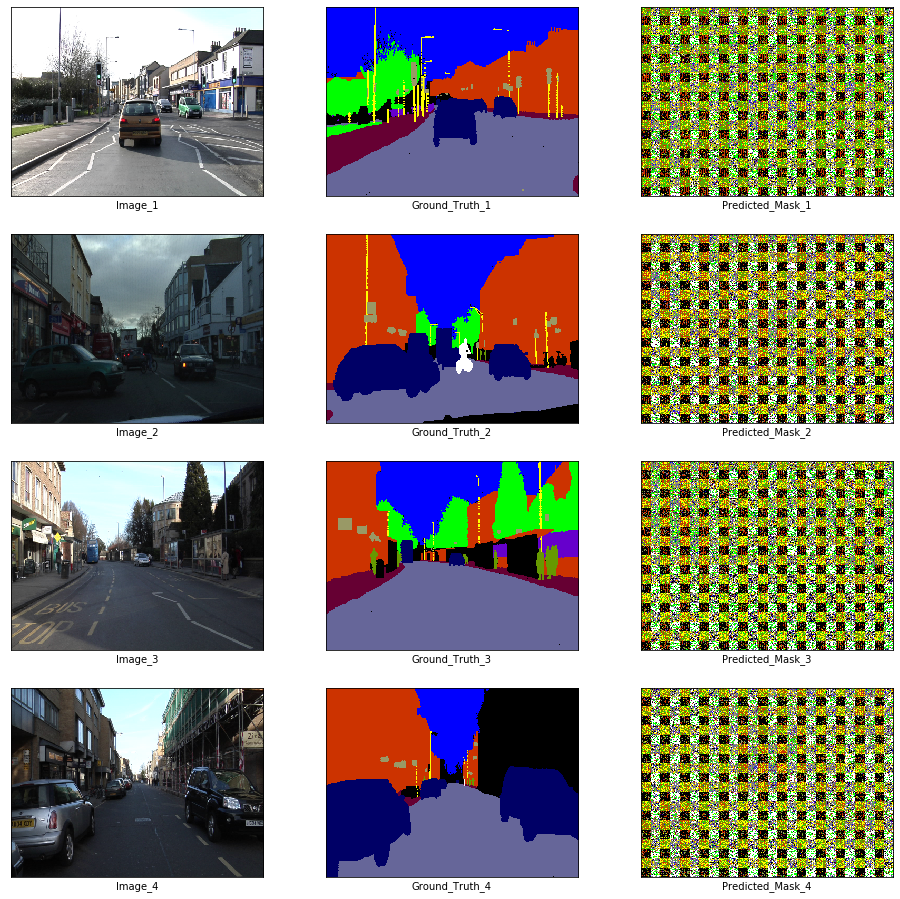

In [20]:
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

## Training

In [21]:
from torch.optim import Adam
from torch.nn import CrossEntropyLoss

The authors make use of a custom class weighing scheme defined as $w_{class} =   \frac{1}{ln(c + p_{class})}$, where `c` is an additional hyper-parameter set to `1.02`. The advantage of this weighing strategy is that in contrast to the inverse class probability weighing strategy, the weights are bounded as the probability approaches 0.

In [22]:
def get_class_weights(loader, num_classes, c=1.02):
    _, y= next(iter(loader))
    y_flat = y.flatten()
    each_class = np.bincount(y_flat, minlength=num_classes)
    p_class = each_class / len(y_flat)
    return 1 / (np.log(c + p_class))

Now, we will set up the Criterion and Optimizer. The learning rate is set to `5e-4` with a weight decay of `2e-4` as mentioned in the paper.

In [23]:
class_weights = get_class_weights(train_loader, 12)
criterion = CrossEntropyLoss(
    weight=torch.FloatTensor(class_weights).to(device)
)
optimizer = Adam(
    enet.parameters(),
    lr=5e-4,
    weight_decay=2e-4
)

Next, we implement the training procedure:

1. We first loop over the Main Training Loop for a particular number of epochs.
2. For each epoch, we loop over the dataset for a particular number of steps which is equal to `length of dataset // batch_size`. This is to ensure that the model gets a chance to look at most of the images in a single epoch.
3. In PyTorch, we need to set the gradients to zero before starting to do backpropragation because PyTorch accumulates the gradients on subsequent backward passes.
4. Perform Backpropagation.
5. Store the training loss.
6. Log the traning results (optional).
7. Perform Validation using the validation dataloader.
8. Log the validation results (optional).
9. Save the model states and results after several epochs (optional).

In [24]:
def train(
	model, train_dataloader, val_dataloader,
	device, criterion, optimizer, train_step_size, val_step_size,
	visualize_every, save_every, save_location, save_prefix, epochs):
	# Make sure that the checkpoint location exists
	try:
		os.mkdir(save_location)
	except:
		pass
	train_loss_history, val_loss_history = [], []
	# Training
	for epoch in range(1, epochs + 1):
		print('Epoch {}\n'.format(epoch))
		# Training
		start = time()
		train_loss = 0
		model.train()
		# Step Loop
		for step in tqdm(range(train_step_size)):
			x_batch, y_batch = next(iter(train_dataloader))
			x_batch = x_batch.squeeze().to(device)
			y_batch = y_batch.squeeze().to(device)
			optimizer.zero_grad()
			out = model(x_batch.float())
			loss = criterion(out, y_batch.long())
			loss.backward()
			optimizer.step()
			train_loss += loss.item()
		train_loss_history.append(train_loss / train_step_size)
		print('\nTraining Loss: {}'.format(train_loss_history[-1]))
		print('Training Time: {} seconds'.format(time() - start))
		# Validation
		val_loss = 0
		model.eval()
		for step in tqdm(range(val_step_size)):
			x_val, y_val = next(iter(val_dataloader))
			x_val = x_val.squeeze().to(device)
			y_val = y_val.squeeze().to(device)
			out = model(x_val.float())
			out = out.data.max(1)[1]
			val_loss += (y_val.long() - out.long()).float().mean()
		val_loss_history.append(val_loss)
		print('\nValidation Loss: {}'.format(val_loss))
		# Visualization
		if epoch % visualize_every == 0:
			x_batch, y_batch = next(iter(train_loader))
			fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
			plt.setp(axes.flat, xticks = [], yticks = [])
			c = 1
			for i, ax in enumerate(axes.flat):
				if i % 3 == 0:
					ax.imshow(ToPILImage()(x_batch[c]))
					ax.set_xlabel('Image_' + str(c))
				elif i % 3 == 1:
					ax.imshow(decode_segmap(y_batch[c], color_dict))
					ax.set_xlabel('Ground_Truth_' + str(c))
				elif i % 3 == 2:
					ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
					ax.set_xlabel('Predicted_Mask_' + str(c))
					c += 1
			plt.show()
		# Checkpoints
		if epoch % save_every == 0:
			checkpoint = {
				'epoch' : epoch,
				'train_loss' : train_loss,
				'val_loss' : val_loss,
				'state_dict' : model.state_dict()
			}
			torch.save(
				checkpoint,
				'{}/{}-{}-{}-{}.pth'.format(
					save_location, save_prefix,
					epoch, train_loss, val_loss
				)
			)
			print('Checkpoint saved')
	print(
        '\nTraining Done.\nTraining Mean Loss: {:6f}\nValidation Mean Loss: {:6f}'.format(
            sum(train_loss_history) / epochs,
            sum(val_loss_history) / epochs
        )
    )
	return train_loss_history, val_loss_history

  0%|          | 0/36 [00:00<?, ?it/s]

Epoch 1



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 2.437408619456821
Training Time: 38.254568338394165 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 3.2387099266052246
Epoch 2



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 2.134702010287179
Training Time: 38.00337266921997 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 6.842370510101318
Epoch 3



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.8943754103448656
Training Time: 37.9686005115509 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 4.666941165924072
Epoch 4



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.7361904382705688
Training Time: 38.02751803398132 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 2.368427038192749
Epoch 5



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.6318797138002183
Training Time: 37.933783531188965 seconds


100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


Validation Loss: 2.1669206619262695


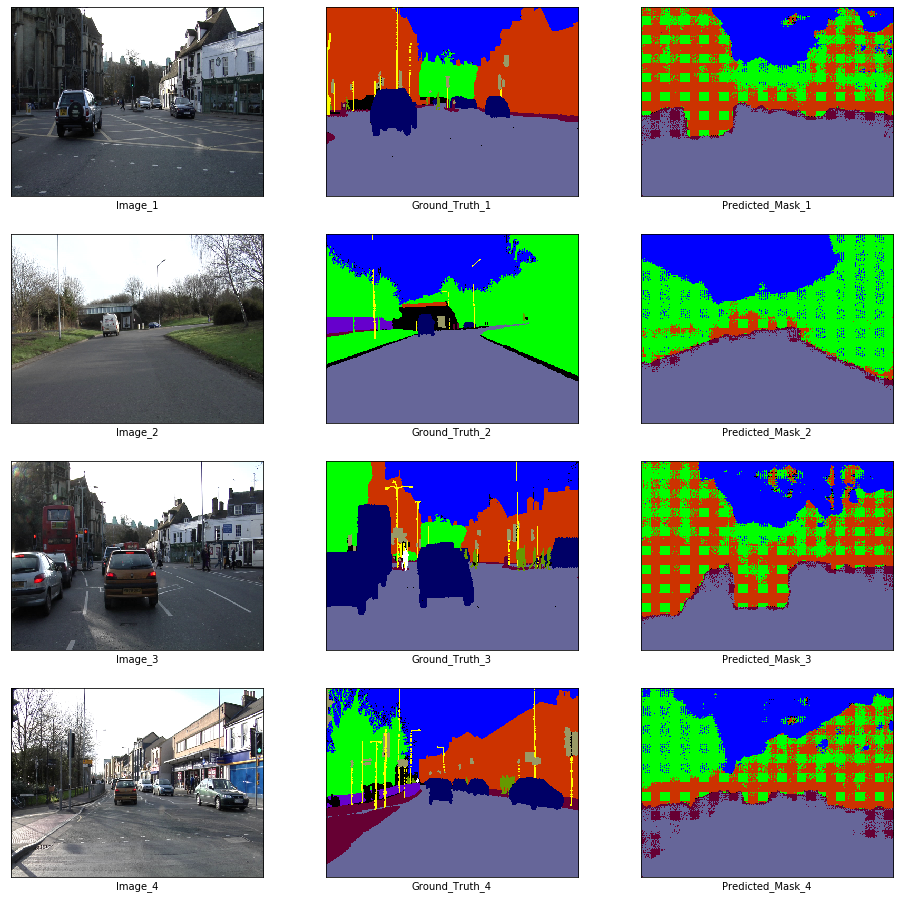

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 6



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.5229995681179895
Training Time: 37.15197157859802 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 2.9224345684051514
Epoch 7



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.452047089735667
Training Time: 37.7402560710907 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 3.615633964538574
Epoch 8



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.4169830514325037
Training Time: 38.28664684295654 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 6.595747947692871
Epoch 9



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.3209271828333538
Training Time: 37.247194051742554 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 7.39718770980835
Epoch 10



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.2905443575647142
Training Time: 37.64794874191284 seconds


100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


Validation Loss: 4.253938674926758


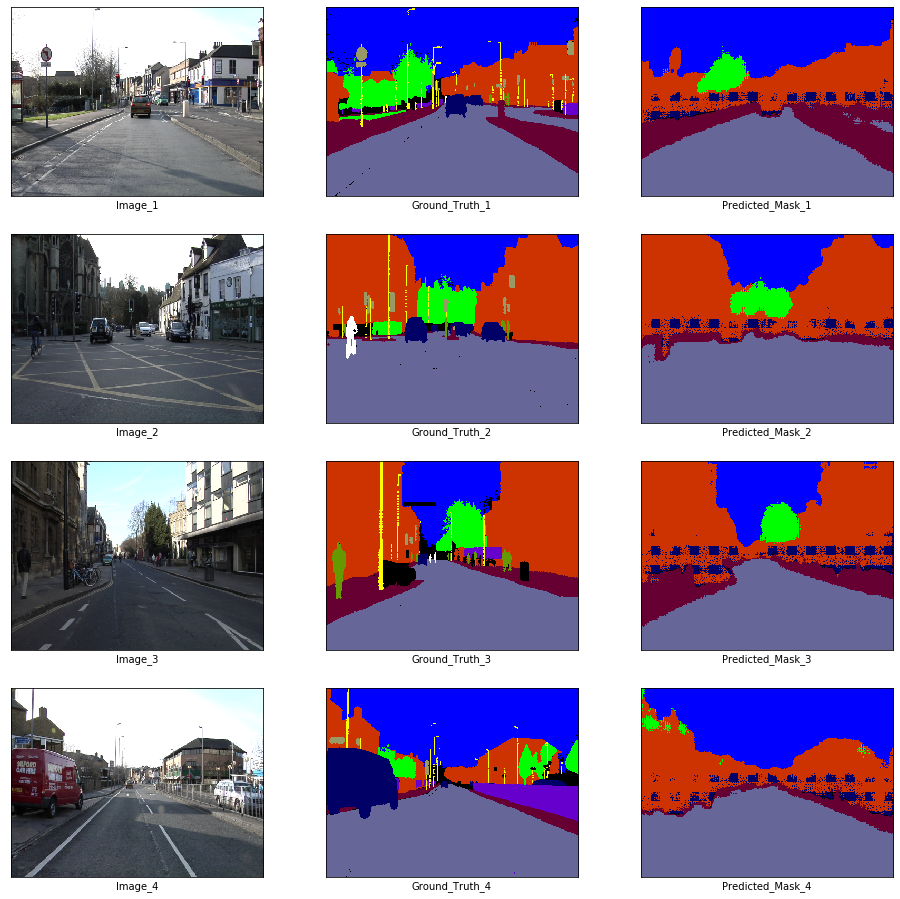

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 11



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.266659266418881
Training Time: 38.43939733505249 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.081944465637207
Epoch 12



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.2042271792888641
Training Time: 36.797977685928345 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.767322301864624
Epoch 13



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.1195721444156435
Training Time: 39.05056595802307 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.8056347370147705
Epoch 14



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.118081572983
Training Time: 37.376230001449585 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.3285722732543945
Epoch 15



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.0625728070735931
Training Time: 38.616103172302246 seconds


100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


Validation Loss: -3.2180628776550293


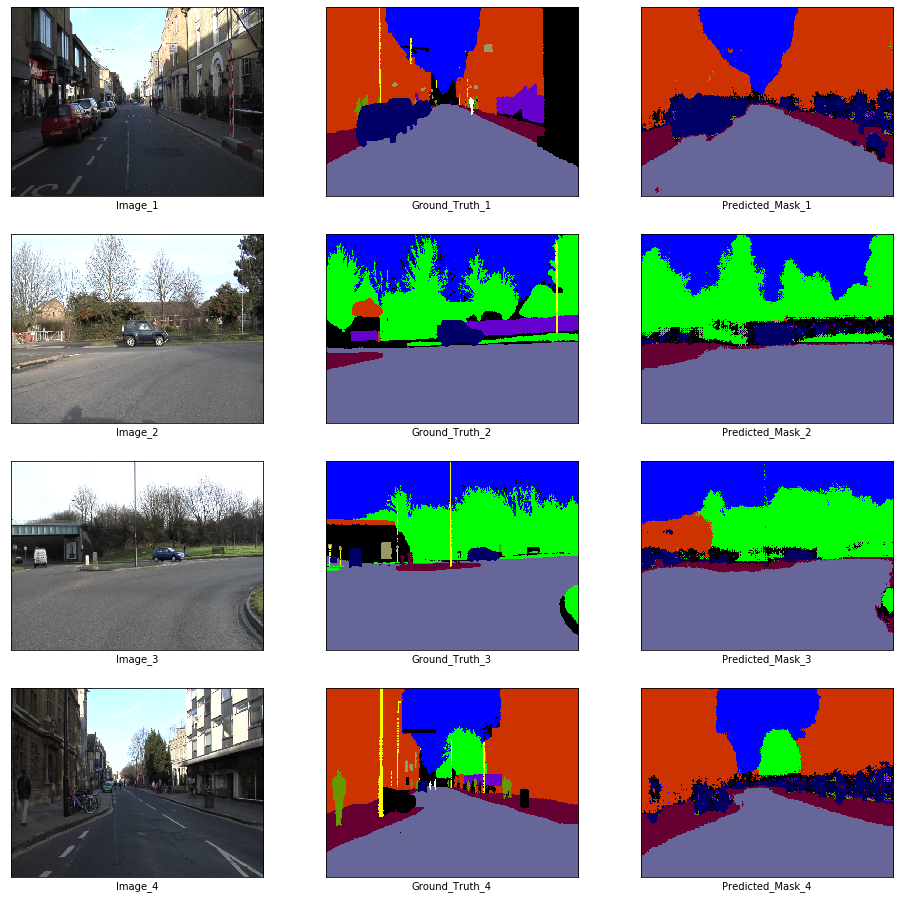

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 16



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.0258759309848149
Training Time: 37.95976376533508 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.4042134284973145
Epoch 17



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9713095559014214
Training Time: 38.42427325248718 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.523252248764038
Epoch 18



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9430050402879715
Training Time: 37.54882740974426 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.347704887390137
Epoch 19



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.948301742474238
Training Time: 38.95602250099182 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.797762870788574
Epoch 20



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9024064739545187
Training Time: 38.540799617767334 seconds


100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


Validation Loss: -7.416412830352783


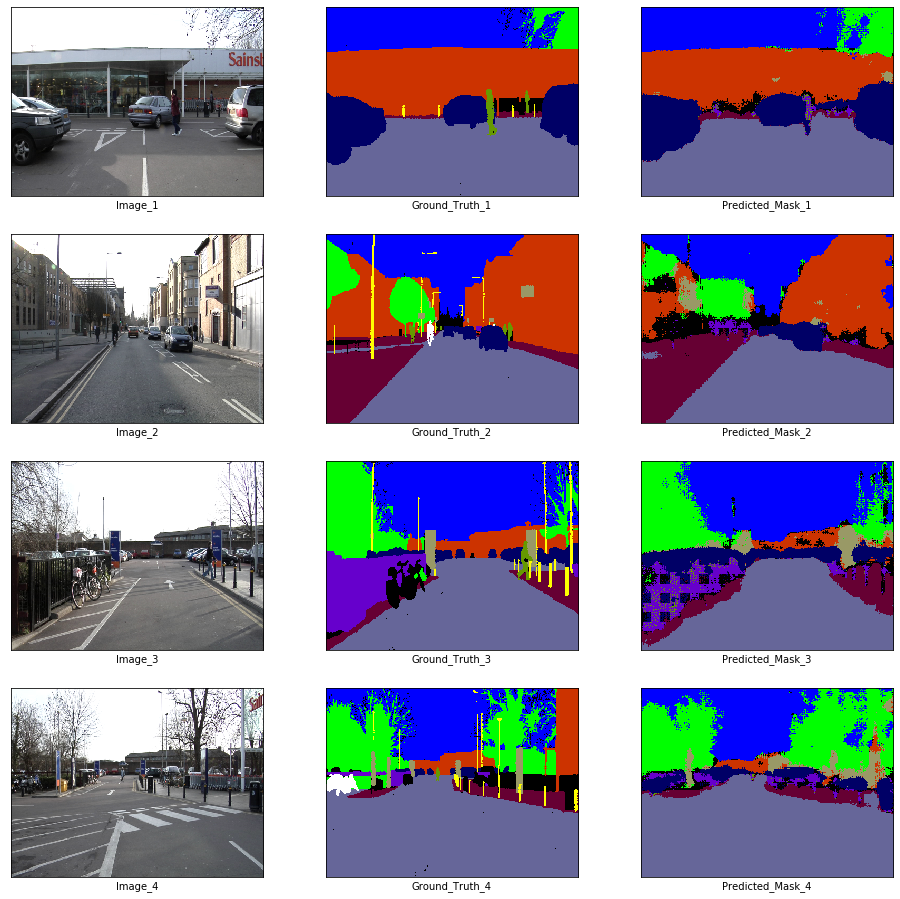

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 21



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8645807007948557
Training Time: 38.05791902542114 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.685373306274414
Epoch 22



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8556970424122281
Training Time: 38.167832374572754 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.5708513259887695
Epoch 23



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8332202765676711
Training Time: 38.15445375442505 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.296716690063477
Epoch 24



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7954185158014297
Training Time: 38.22439479827881 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.781039714813232
Epoch 25



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7844055063194699
Training Time: 38.96990346908569 seconds


100%|██████████| 10/10 [00:08<00:00,  1.13it/s]


Validation Loss: -11.188081741333008


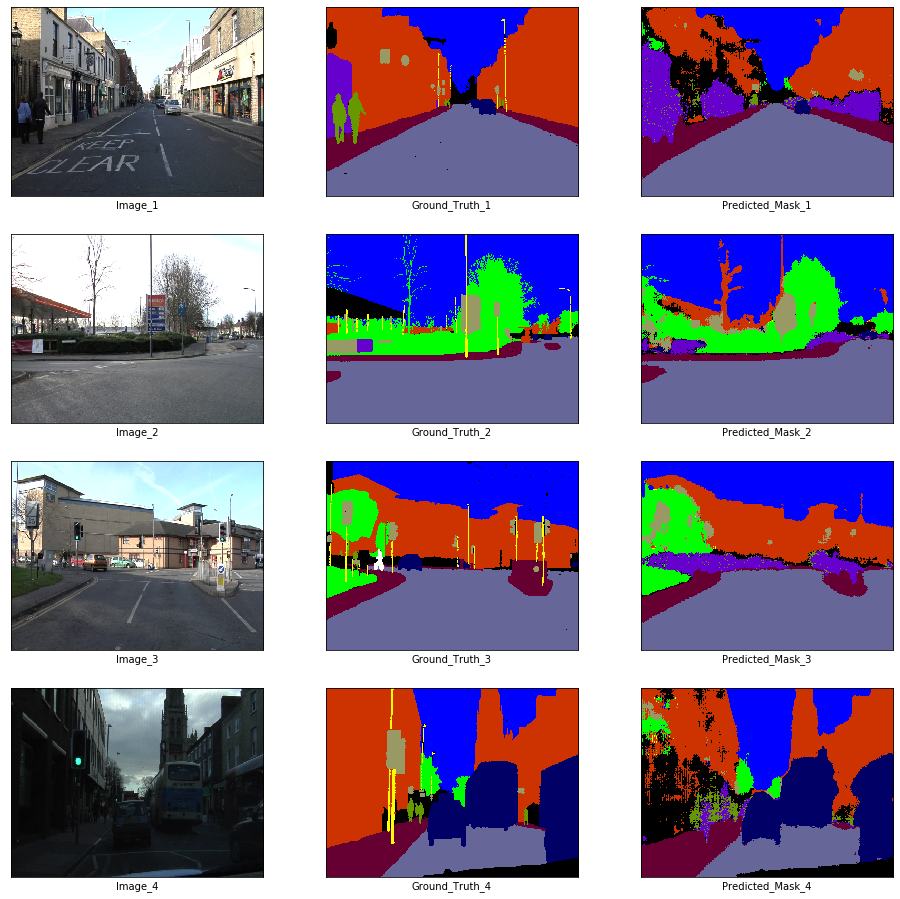

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 26



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7715499268637763
Training Time: 37.52217769622803 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.127667427062988
Epoch 27



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7553856323162714
Training Time: 38.4911105632782 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.303741455078125
Epoch 28



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7428910235563914
Training Time: 38.940491676330566 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.910610675811768
Epoch 29



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7099202639526792
Training Time: 39.84367513656616 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.1565041542053223
Epoch 30



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7051044089926614
Training Time: 37.80978608131409 seconds


100%|██████████| 10/10 [00:08<00:00,  1.15it/s]


Validation Loss: -6.113397598266602


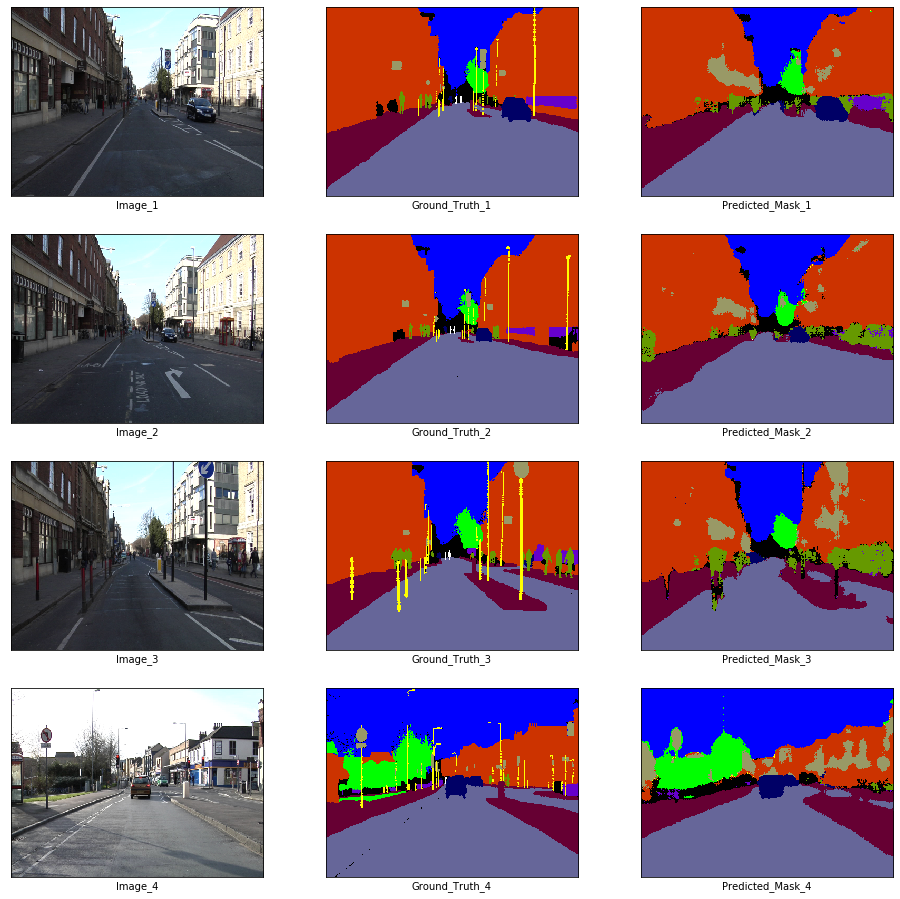

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 31



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.688480739792188
Training Time: 37.97763395309448 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.019374847412109
Epoch 32



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6417338417636024
Training Time: 39.010459899902344 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.51849365234375
Epoch 33



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6507616125875049
Training Time: 38.68811392784119 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.065035820007324
Epoch 34



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6284405754672157
Training Time: 38.08013319969177 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.379837512969971
Epoch 35



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6322183062632879
Training Time: 38.241512060165405 seconds


100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


Validation Loss: -6.318979263305664


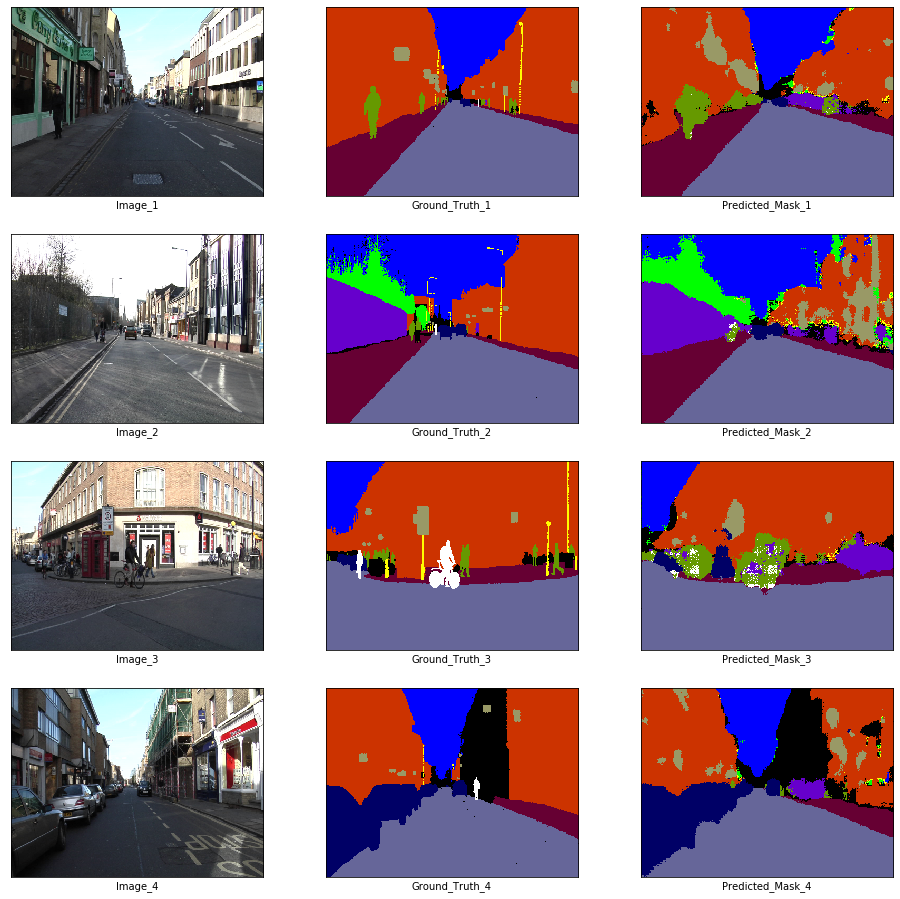

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 36



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.602162680692143
Training Time: 39.469756841659546 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.175929546356201
Epoch 37



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6143680529461967
Training Time: 38.00869083404541 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.697519302368164
Epoch 38



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6021687537431717
Training Time: 37.92976999282837 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.973897457122803
Epoch 39



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.575982139342361
Training Time: 37.99849581718445 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.123241901397705
Epoch 40



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.548812049958441
Training Time: 37.72510290145874 seconds


100%|██████████| 10/10 [00:08<00:00,  1.21it/s]


Validation Loss: -3.017280101776123


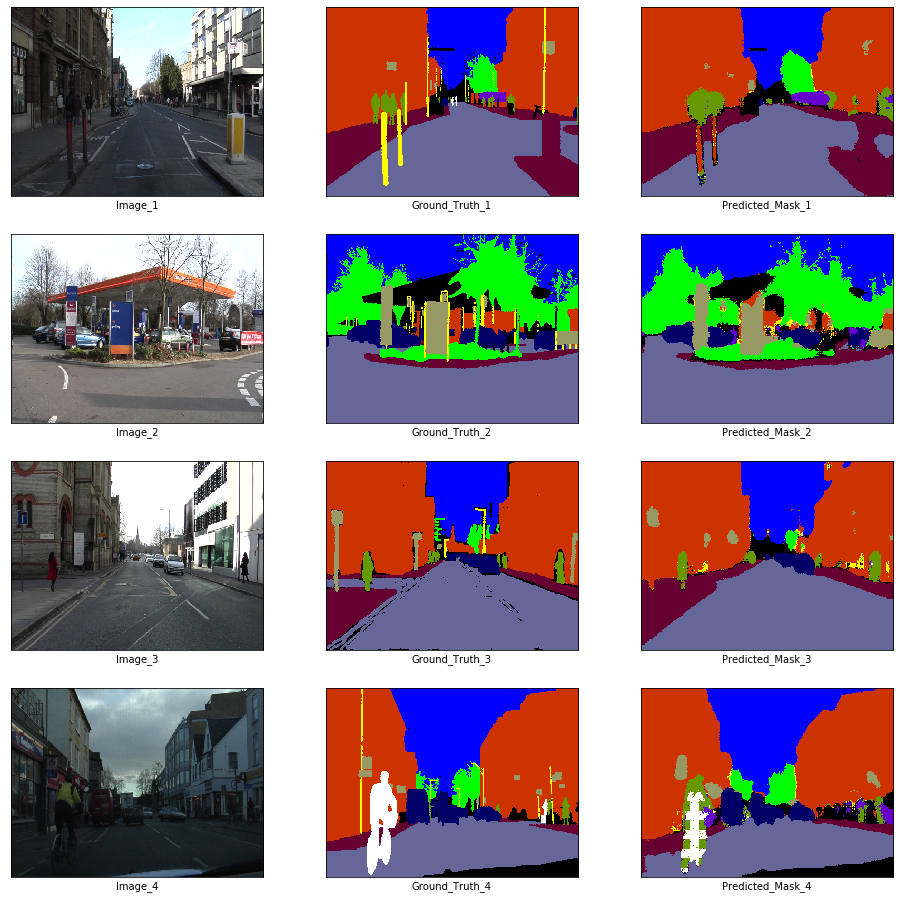

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 41



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5473749430643188
Training Time: 38.174437522888184 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.733024597167969
Epoch 42



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5595441427495744
Training Time: 38.81111693382263 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.757671356201172
Epoch 43



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5553514916035864
Training Time: 39.12799692153931 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.839480876922607
Epoch 44



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.548303872346878
Training Time: 39.74030923843384 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.013036251068115
Epoch 45



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5256297008858787
Training Time: 38.856330156326294 seconds


100%|██████████| 10/10 [00:08<00:00,  1.21it/s]


Validation Loss: -5.119277477264404


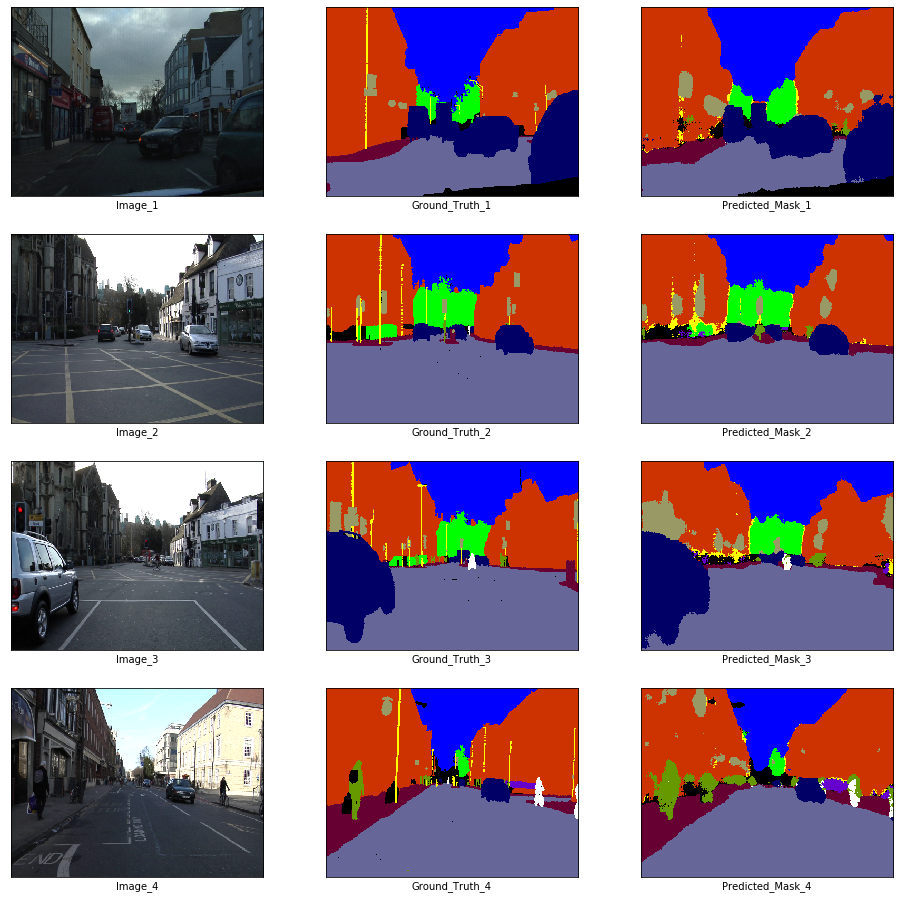

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 46



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5306878238916397
Training Time: 38.36300086975098 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.125565052032471
Epoch 47



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5135461456245847
Training Time: 39.08766198158264 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.6961283683776855
Epoch 48



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5066616568300459
Training Time: 37.34969782829285 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.162487030029297
Epoch 49



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5041006389591429
Training Time: 38.08589458465576 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.301435947418213
Epoch 50



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5004545317755805
Training Time: 38.49272561073303 seconds


100%|██████████| 10/10 [00:08<00:00,  1.15it/s]


Validation Loss: -4.912712097167969


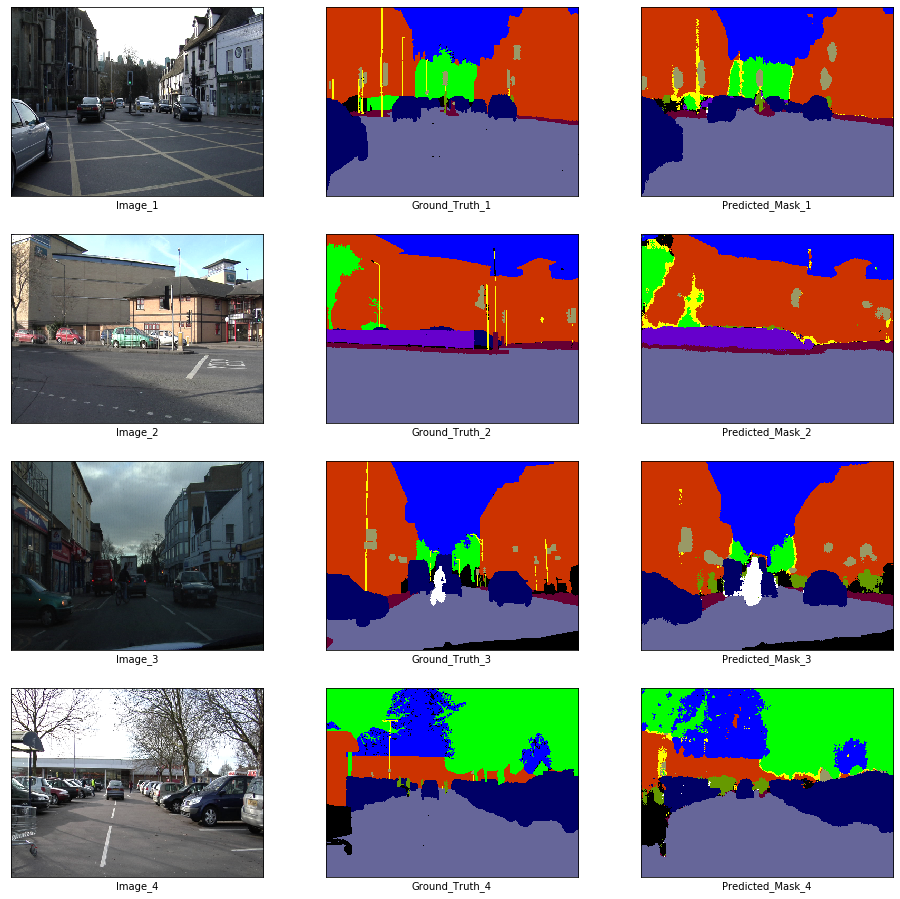

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 51



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.48679905633131665
Training Time: 38.75876545906067 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.478184223175049
Epoch 52



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4895109683275223
Training Time: 39.72389554977417 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.7731525897979736
Epoch 53



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.46369364278184044
Training Time: 38.41017484664917 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.12853479385376
Epoch 54



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4660072334938579
Training Time: 36.974772214889526 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.892141103744507
Epoch 55



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4567573799027337
Training Time: 37.838648080825806 seconds


100%|██████████| 10/10 [00:08<00:00,  1.16it/s]


Validation Loss: -3.5138909816741943


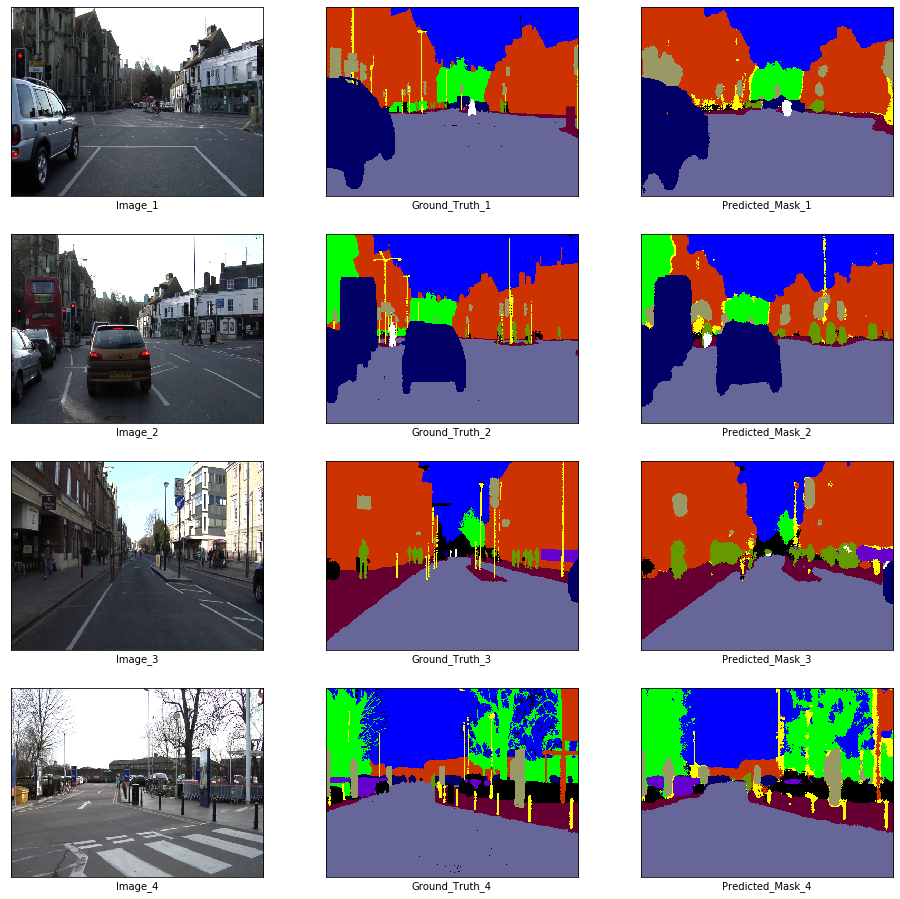

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 56



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.46761518385675216
Training Time: 39.095802545547485 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.1811041831970215
Epoch 57



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.45723862532112336
Training Time: 39.738494634628296 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.7637627124786377
Epoch 58



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.451055195596483
Training Time: 38.80954456329346 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.753784656524658
Epoch 59



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4373304612106747
Training Time: 38.44563937187195 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.5942258834838867
Epoch 60



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4351210387216674
Training Time: 38.57187056541443 seconds


100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


Validation Loss: -3.4249513149261475


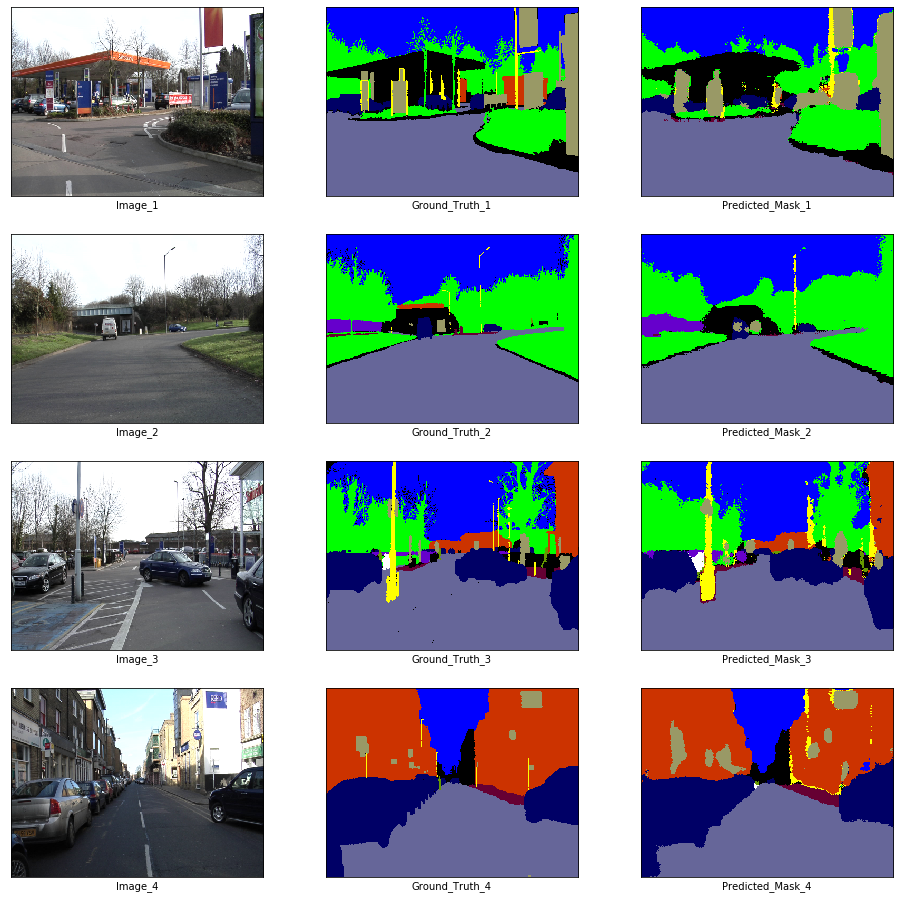

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 61



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4364438553651174
Training Time: 38.90171480178833 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.3254640102386475
Epoch 62



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4354195644458135
Training Time: 37.203686237335205 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.915332794189453
Epoch 63



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.43886617405547035
Training Time: 37.38569188117981 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.396020889282227
Epoch 64



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4454670738842752
Training Time: 38.194111347198486 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.372065544128418
Epoch 65



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.42193759895033306
Training Time: 38.03181052207947 seconds


100%|██████████| 10/10 [00:08<00:00,  1.20it/s]


Validation Loss: -3.616990089416504


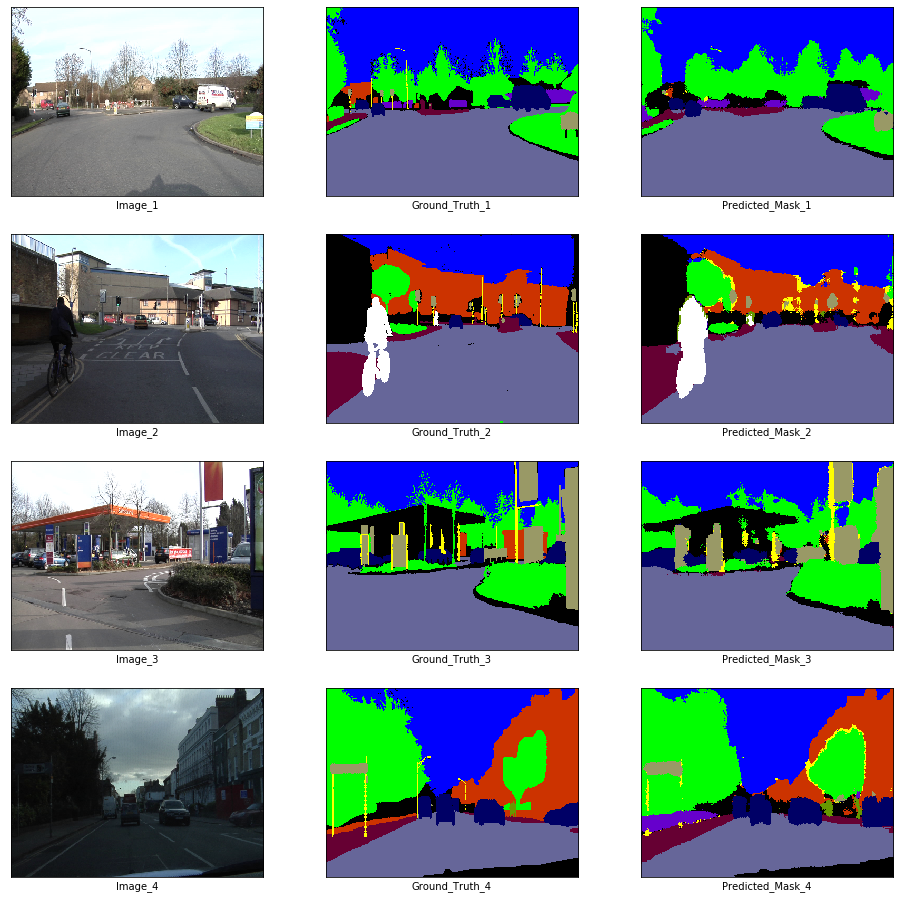

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 66



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.41898736357688904
Training Time: 38.265477418899536 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.530419111251831
Epoch 67



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4048156630661752
Training Time: 38.2088258266449 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.2229714393615723
Epoch 68



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4071968462732103
Training Time: 38.18205118179321 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.070570468902588
Epoch 69



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.40627463079161114
Training Time: 38.72517728805542 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.3719496726989746
Epoch 70



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.40131483723719913
Training Time: 38.716614961624146 seconds


100%|██████████| 10/10 [00:08<00:00,  1.25it/s]


Validation Loss: -4.465600967407227


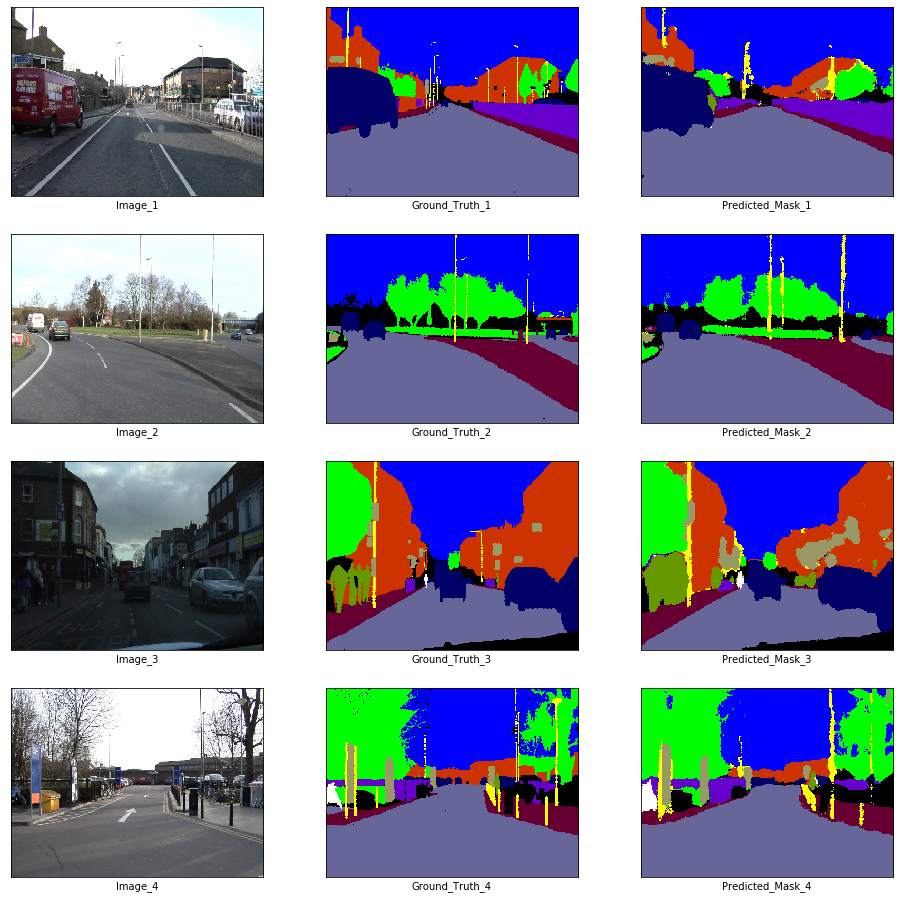

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 71



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.38607188645336366
Training Time: 37.528955936431885 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.431641101837158
Epoch 72



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.38019899858368766
Training Time: 38.17856478691101 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.2855310440063477
Epoch 73



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3934260234236717
Training Time: 37.19914793968201 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.1481330394744873
Epoch 74



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3811521447367138
Training Time: 38.78637433052063 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.339162826538086
Epoch 75



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.40046225984891254
Training Time: 38.148630142211914 seconds


100%|██████████| 10/10 [00:07<00:00,  1.26it/s]


Validation Loss: -2.751192569732666


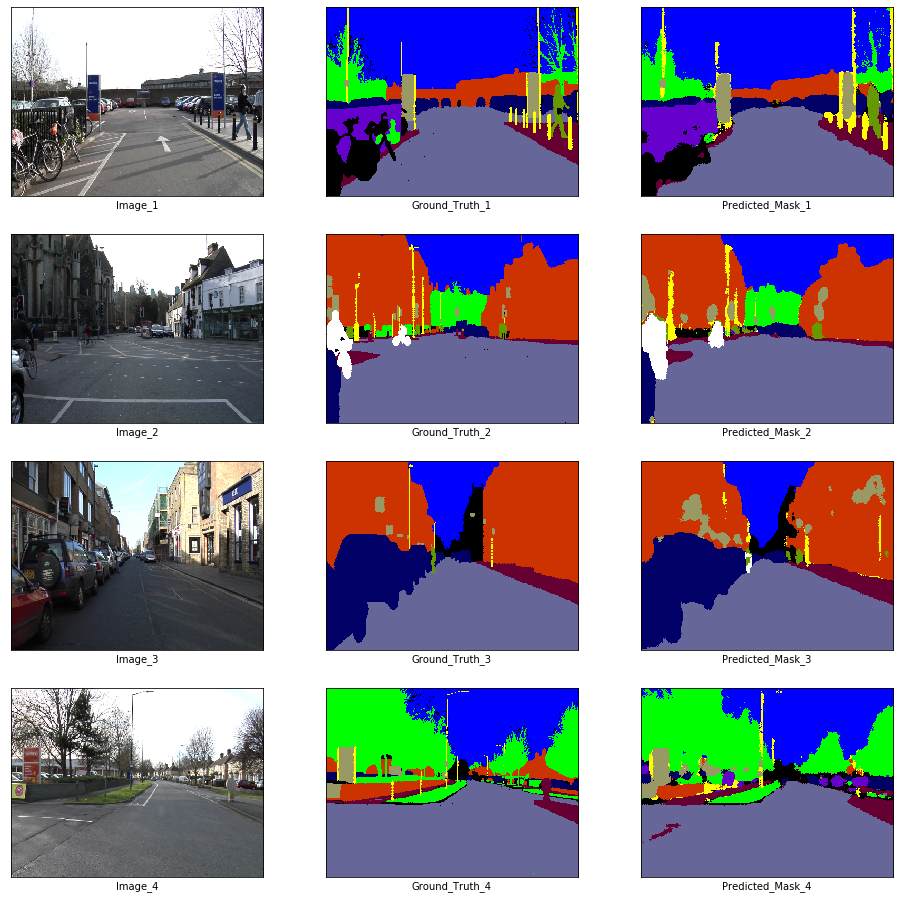

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 76



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.39338786982827717
Training Time: 38.892008543014526 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.6394565105438232
Epoch 77



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3714061826467514
Training Time: 39.37867617607117 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.0792481899261475
Epoch 78



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.37320198284255135
Training Time: 39.188267946243286 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.970547914505005
Epoch 79



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36254098349147373
Training Time: 38.43571925163269 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.955782890319824
Epoch 80



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3649415208233727
Training Time: 39.063952922821045 seconds


100%|██████████| 10/10 [00:08<00:00,  1.19it/s]


Validation Loss: -5.170443534851074


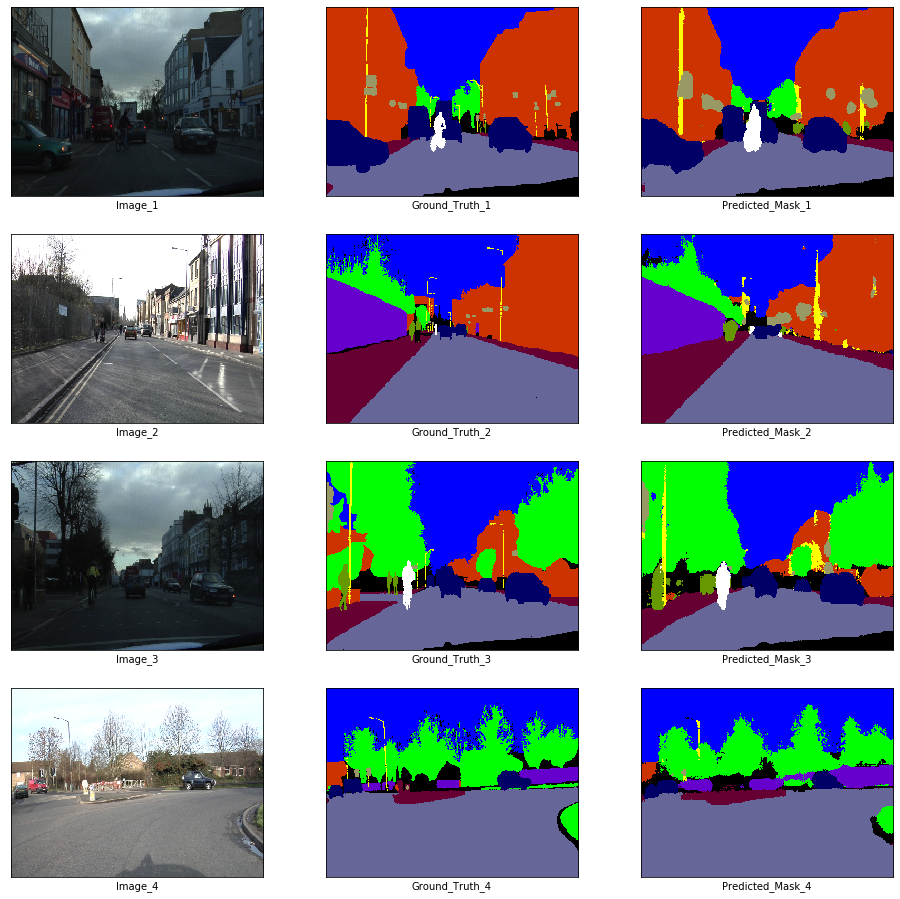

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 81



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3718844602505366
Training Time: 40.250274658203125 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.7840797901153564
Epoch 82



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3703037202358246
Training Time: 39.11137318611145 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.161880970001221
Epoch 83



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.35744786428080666
Training Time: 38.31591272354126 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.355990171432495
Epoch 84



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.35531315124697155
Training Time: 38.48253321647644 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.752293348312378
Epoch 85



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3564377981755469
Training Time: 38.86867308616638 seconds


100%|██████████| 10/10 [00:09<00:00,  1.09it/s]


Validation Loss: -5.668622970581055


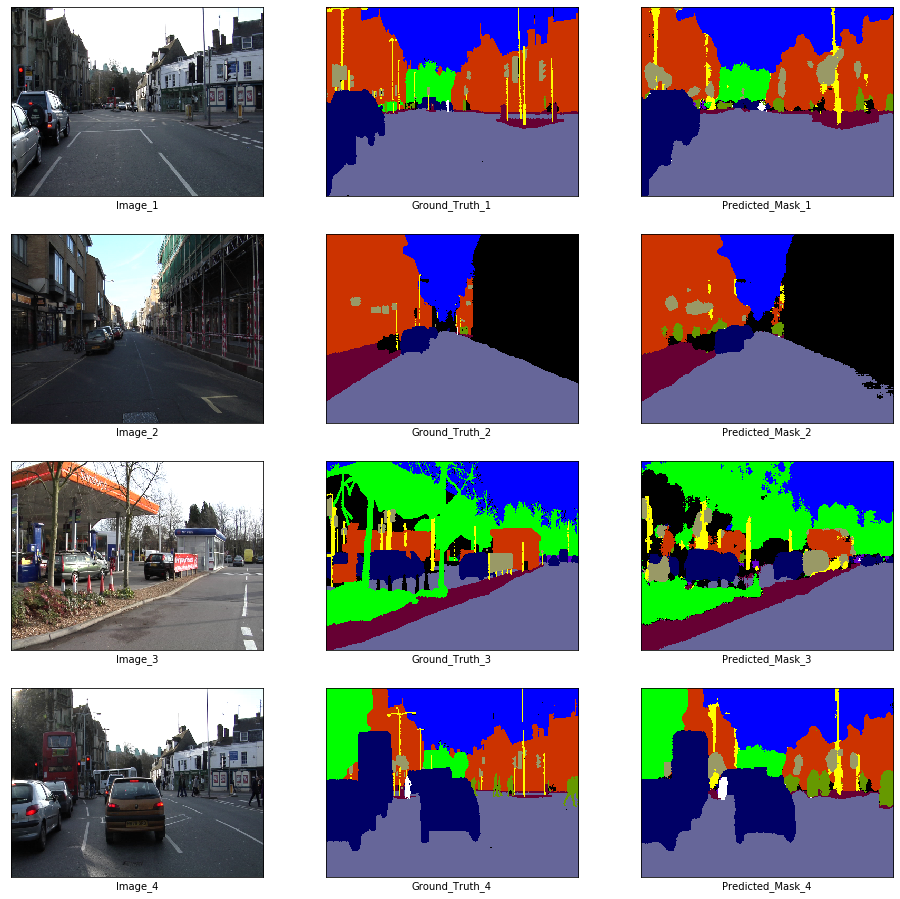

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 86



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3664483850200971
Training Time: 38.6973295211792 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.627695322036743
Epoch 87



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.33714793043004143
Training Time: 38.387247800827026 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.2198407649993896
Epoch 88



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.34416329860687256
Training Time: 38.202924489974976 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.2741477489471436
Epoch 89



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3593054951892959
Training Time: 38.469452142715454 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.3437302112579346
Epoch 90



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.34524476693736184
Training Time: 38.30483436584473 seconds


100%|██████████| 10/10 [00:08<00:00,  1.18it/s]


Validation Loss: -2.6302378177642822


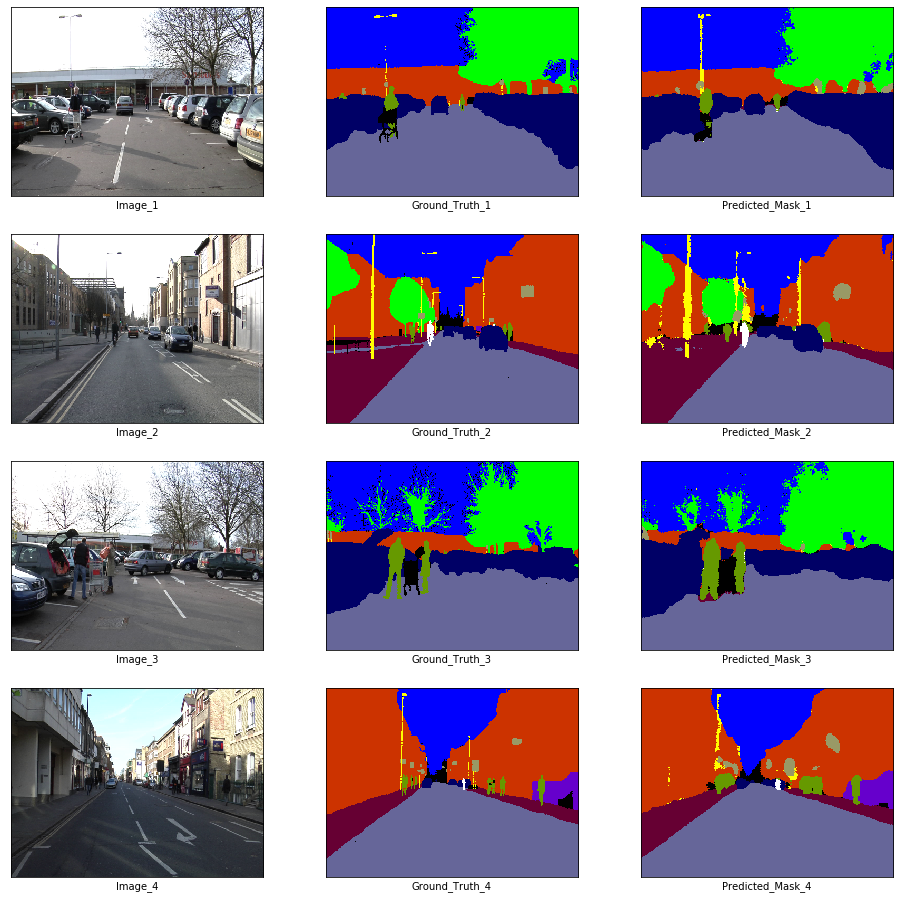

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 91



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3448857234583961
Training Time: 40.798344135284424 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.8512980937957764
Epoch 92



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.34296291404300266
Training Time: 38.72410726547241 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.8460123538970947
Epoch 93



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.34320977826913196
Training Time: 39.44770669937134 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.2975656986236572
Epoch 94



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3392660617828369
Training Time: 37.99251914024353 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.5989151000976562
Epoch 95



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.33899713307619095
Training Time: 39.186673641204834 seconds


100%|██████████| 10/10 [00:08<00:00,  1.18it/s]


Validation Loss: -3.5001461505889893


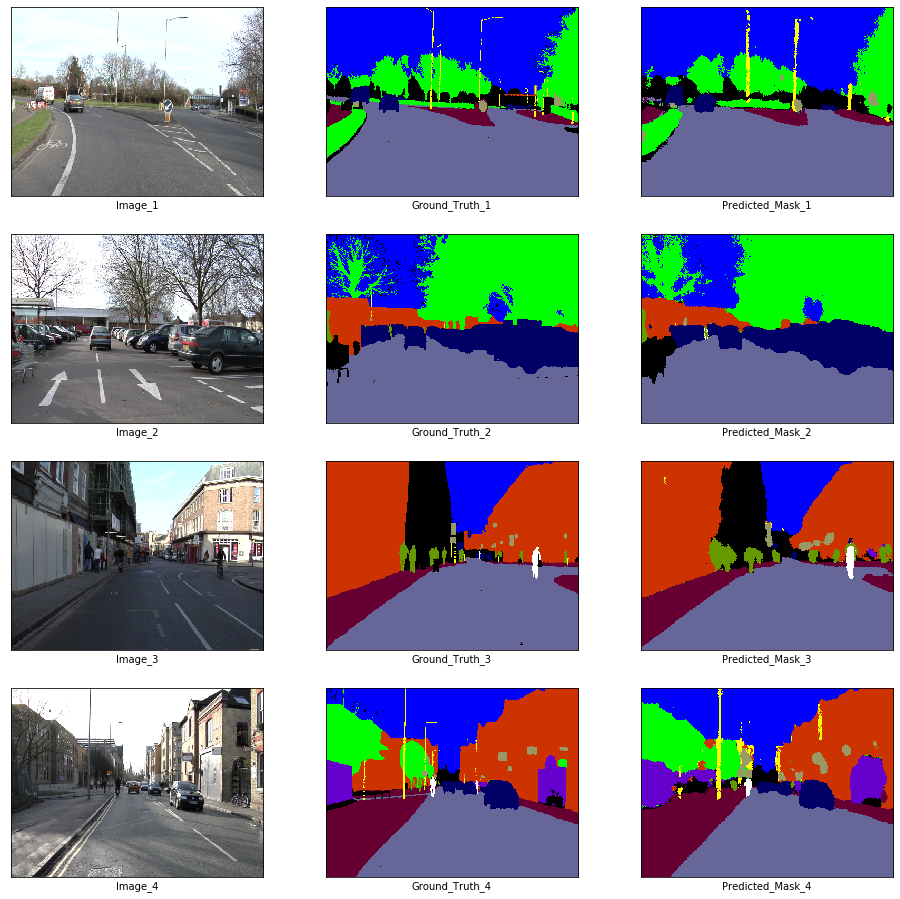

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 96



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3510216532482041
Training Time: 39.12900400161743 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.395893096923828
Epoch 97



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.33355874319871265
Training Time: 39.35929298400879 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.510538339614868
Epoch 98



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3213251498010423
Training Time: 39.009578466415405 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.540505886077881
Epoch 99



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3264128880368339
Training Time: 38.70136380195618 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.906582832336426
Epoch 100



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3266608830955293
Training Time: 38.69211673736572 seconds


100%|██████████| 10/10 [00:08<00:00,  1.13it/s]


Validation Loss: -2.677605390548706


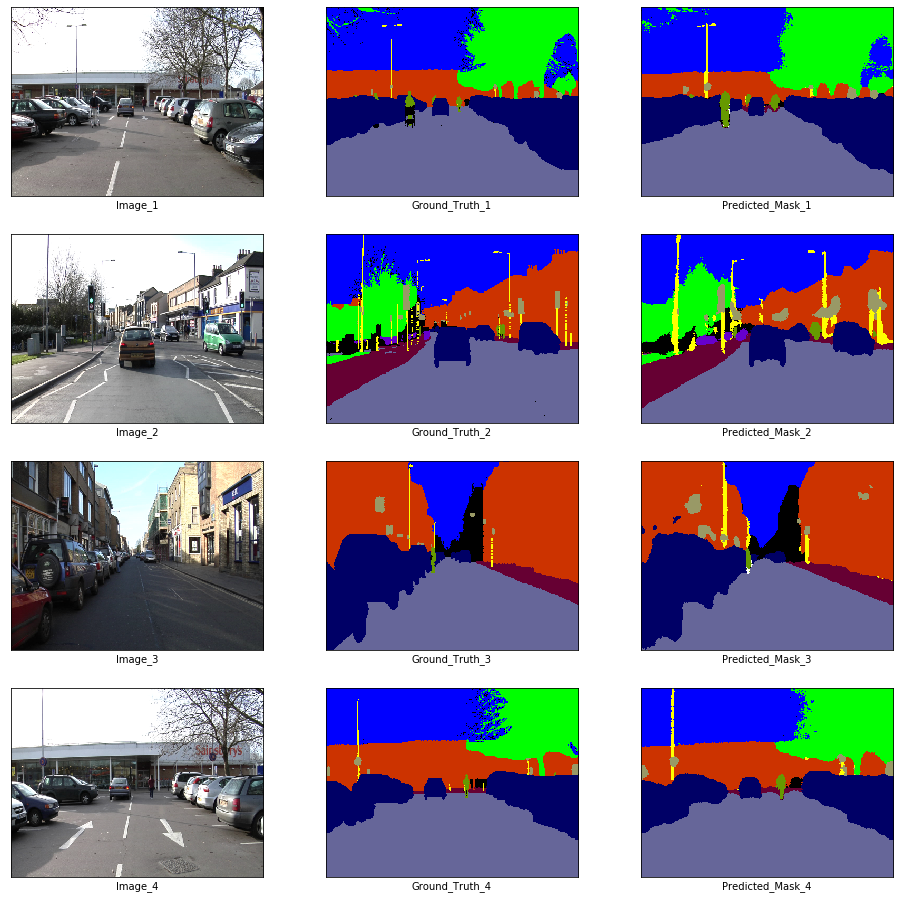

Checkpoint saved

Training Done.
Training Mean Loss: 0.662617
Validation Mean Loss: -3.342128


In [25]:
train_loss_history, val_loss_history = train(
    enet, train_loader, val_loader,
    device, criterion, optimizer,
    len(train_images) // batch_size,
    len(val_images) // batch_size, 5,
    5, './checkpoints', 'enet-model', 100
)

Now, let us visualize the results...

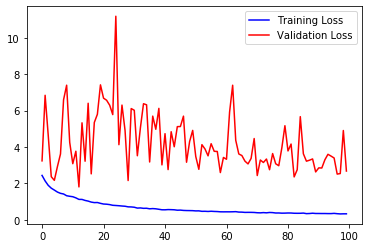

In [26]:
plt.plot(train_loss_history, color = 'b', label = 'Training Loss')
plt.plot([abs(i) for i in val_loss_history], color = 'r', label = 'Validation Loss')
plt.legend()
plt.show()

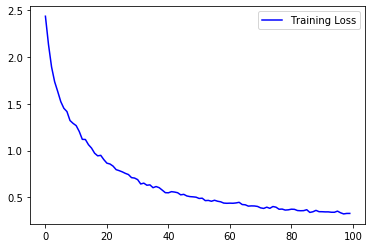

In [27]:
plt.plot(train_loss_history, color = 'b', label = 'Training Loss')
plt.legend()
plt.show()

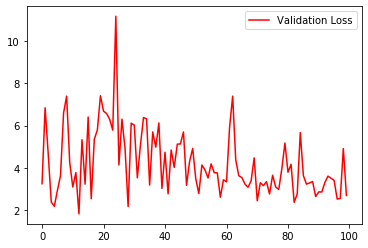

In [28]:
plt.plot([abs(i) for i in val_loss_history], color = 'r', label = 'Validation Loss')
plt.legend()
plt.show()

## Prediction

We will be predicting with the weights at epoch 65 where both training and validation loss seems to be stable. This is done in order to avoid overfitting.

In [33]:
state_dict = torch.load('./checkpoints/enet-model-65-14.726004391908646--3.9436190128326416.pth')['state_dict']
enet.load_state_dict(state_dict)

<All keys matched successfully>

Prediction on Training Data

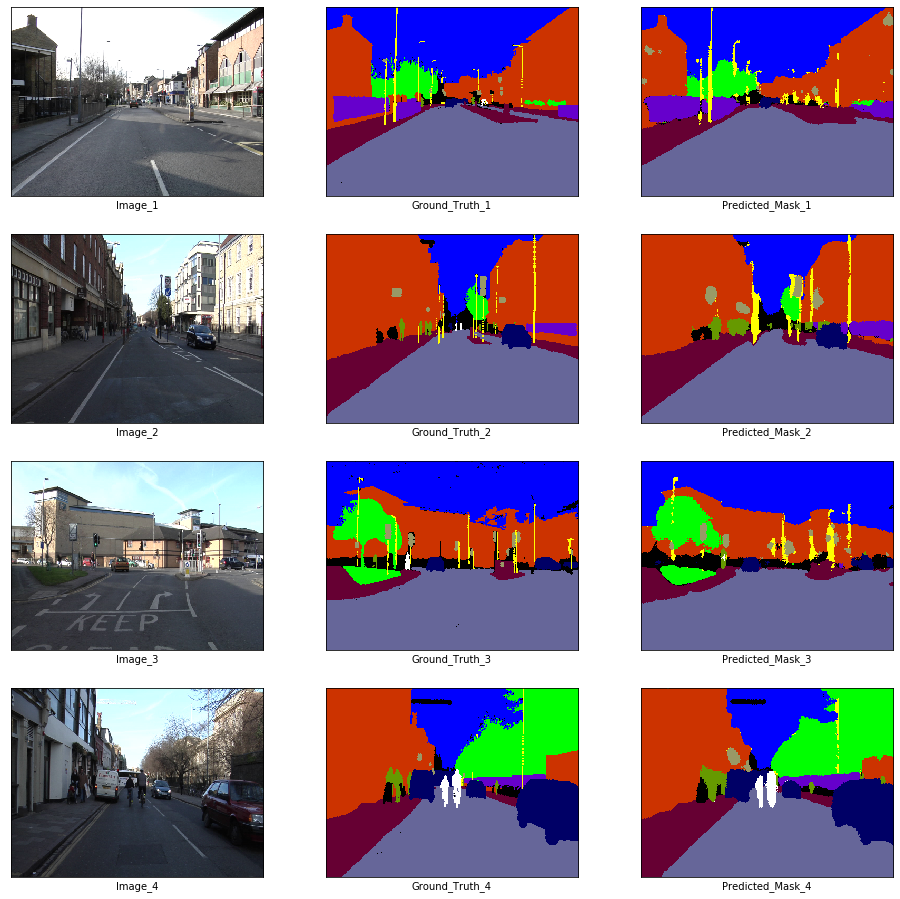

In [29]:
x_batch, y_batch = next(iter(train_loader))
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

Prediction on Validation Data

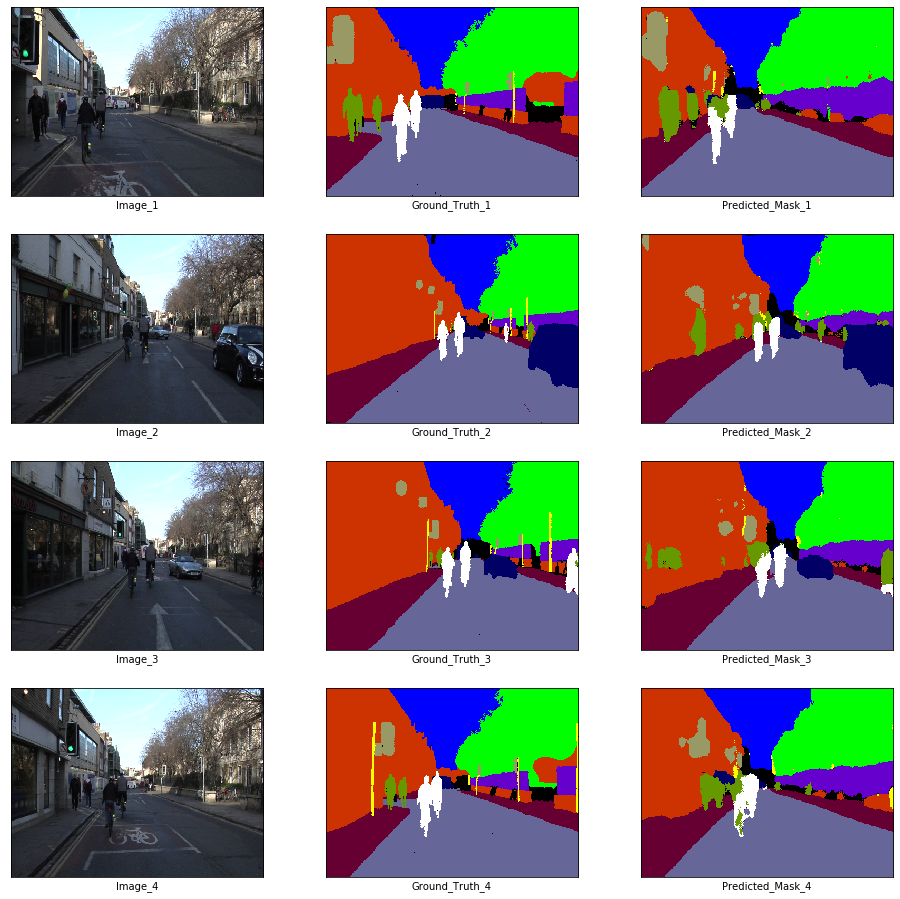

In [30]:
x_batch, y_batch = next(iter(val_loader))
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

In [29]:
import pickle
file = open('mish-enet-train_loss_hist.pkl', 'wb')
pickle.dump(train_loss_history, file)
file.close()
file = open('mish-enet-val_loss_hist.pkl', 'wb')
pickle.dump(val_loss_history, file)
file.close()